In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.utils import resample
from sklearn.preprocessing  import  scale
from sklearn.decomposition  import PCA
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import validation_curve
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import os
from sklearn.metrics import silhouette_score, homogeneity_score

In [2]:
data = pd.read_csv(r"C:\Users\vaasimak\Desktop\Μεταπτυχιακό\CI-SL\3η ερ\dataset1.csv") #reading the csv files using pandas

# Data preperation

In [3]:
y = data['label']
X = data.drop(columns='label')
X=pd.DataFrame(X)

In [4]:
len(y)

42000

In [5]:
x_np =X.to_numpy()

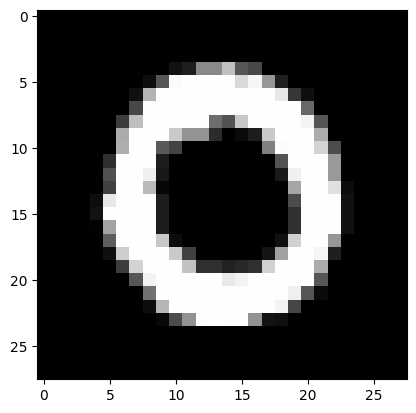

In [6]:
plt.imshow(x_np[1].reshape(28,28),cmap ='gray')

In [7]:
X_downsampled=resample(
    X,
    replace=False,
    n_samples=5000,
    random_state=42)

In [8]:
X_downsampled.shape

(5000, 784)

In [9]:
y_downsampled=resample(
    y,
    replace=False,
    n_samples=5000,
    random_state=42)

In [10]:
y_downsampled.shape

(5000,)

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_downsampled)

# T-SNE

In [12]:
from sklearn.manifold import TSNE
n_components = 2
tsne = TSNE(n_components=2,perplexity=20)
x_tsne = tsne.fit_transform(X_downsampled)

## Plot for t-SNE

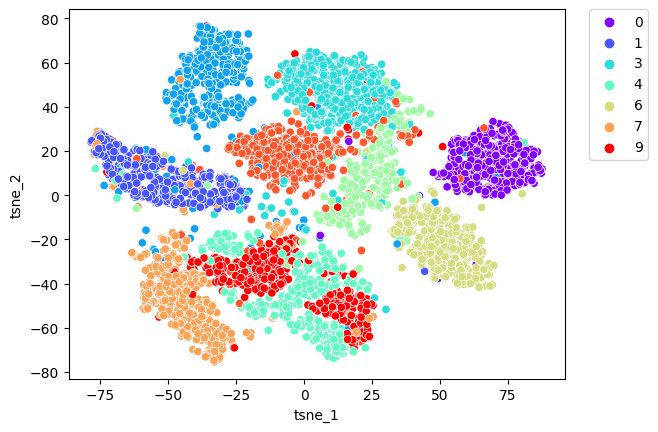

In [13]:
import seaborn as sns
tsne_result_df = pd.DataFrame({'tsne_1': x_tsne[:,0], 'tsne_2': x_tsne[:,1], 'label': y_downsampled})
fig, ax = plt.subplots(1)
sns.scatterplot(x='tsne_1', y='tsne_2', hue='label',palette='rainbow', data=tsne_result_df, ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

## Pairplot for t-SNE

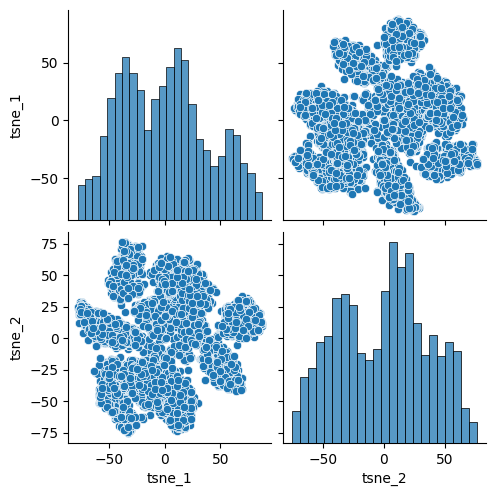

In [14]:
sns.pairplot(tsne_result_df.drop(columns='label'))

# Spectral Clustering with RBF

In [15]:
from sklearn.cluster import SpectralClustering
sc = SpectralClustering(n_clusters=10,affinity='rbf',assign_labels='kmeans',n_jobs=-1)
labels_rbf = sc.fit_predict(x_tsne)

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:393: UserWarning: Exited at iteration 312 with accuracies 
[3.08591690e-15 1.64335501e-04 1.71265547e-04 1.68500964e-04
 1.51707668e-04 1.47507375e-04 1.51676827e-04 1.59545019e-04
 1.56794938e-04 1.57804739e-04 1.57706281e-04]
not reaching the requested tolerance 0.00015811388300841897.
  _, diffusion_map = lobpcg(


In [16]:
silhouette = silhouette_score(x_tsne, labels_rbf)
homogeneity = homogeneity_score(y_downsampled, labels_rbf)
print("rbf: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(10, silhouette, homogeneity))

rbf: 10 
 Silhouette score: -0.405 
 Homogeneity score: 0.246


## Comparison between Spectral Clustering and t-SNE

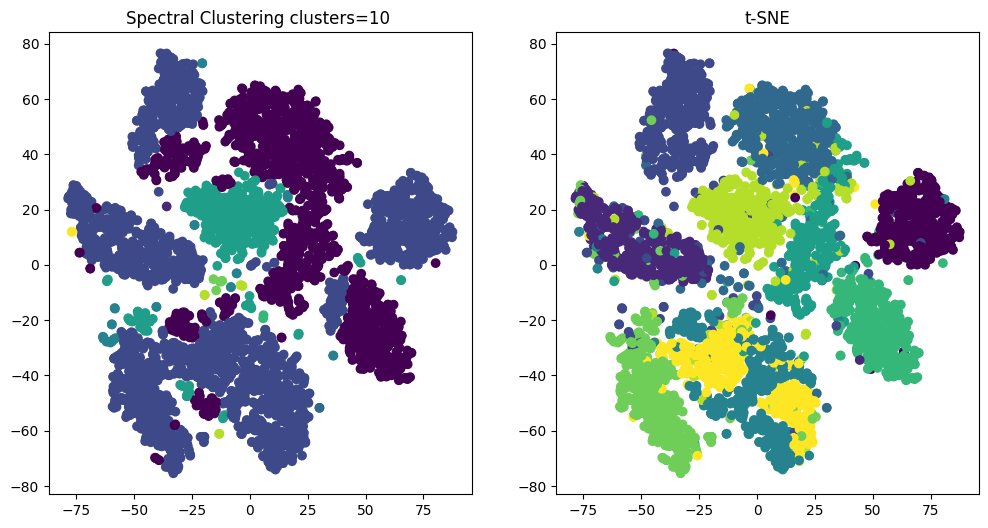

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Create a scatter plot of the clustered data in the first subplot
ax[0].scatter(x_tsne[:, 0], x_tsne[:, 1], c=labels_rbf)
ax[0].set_title("Spectral Clustering clusters={} ".format(10))

# Create a scatter plot of the t-SNE reduced data in the second subplot
ax[1].scatter(x_tsne[:, 0], x_tsne[:, 1],c=y_downsampled)
ax[1].set_title("t-SNE")

plt.show()

# Spectral Clustering with nearest neighbors

## Comparison between the different values of nearest neighbors and t-SNE

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_neighbors: 5 
 Silhouette score: -0.158 
 Homogeneity score: 0.192


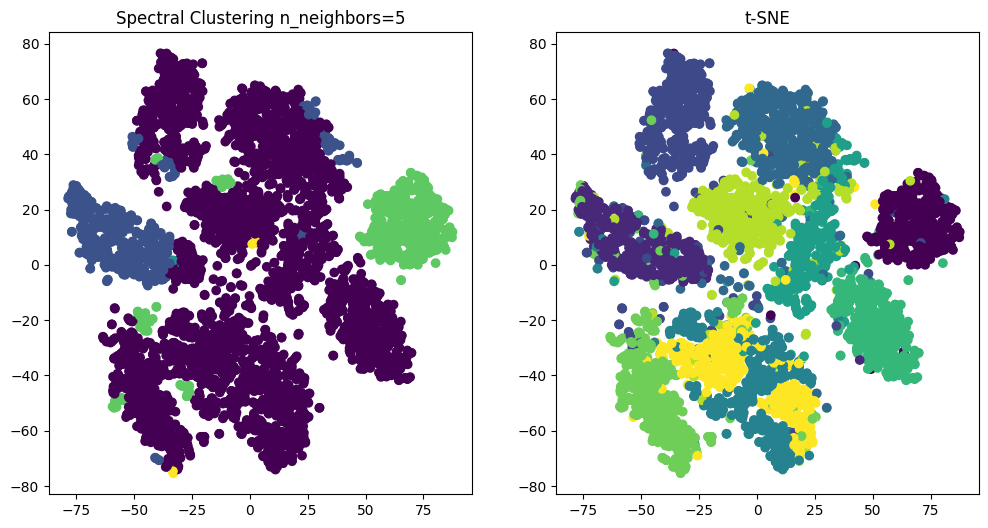

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_neighbors: 10 
 Silhouette score: 0.443 
 Homogeneity score: 0.728


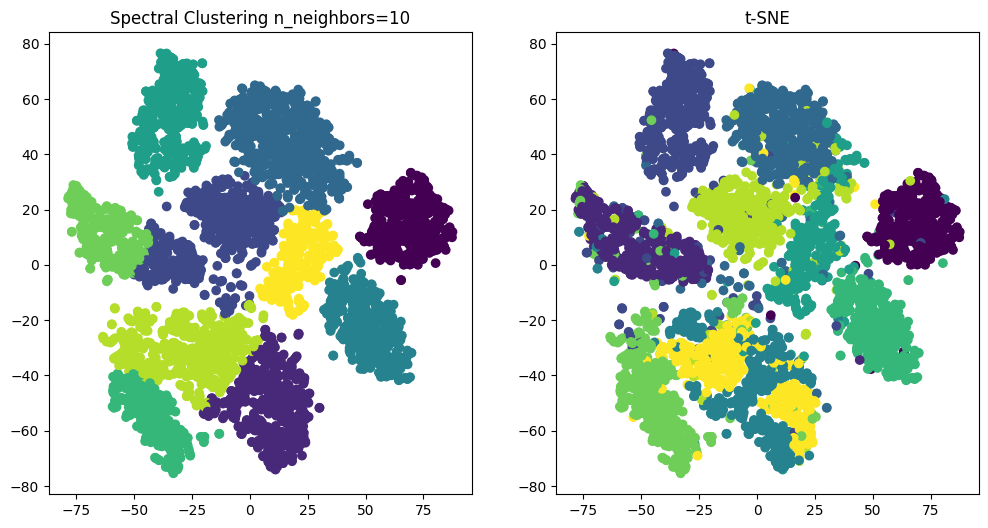

n_neighbors: 15 
 Silhouette score: 0.428 
 Homogeneity score: 0.785


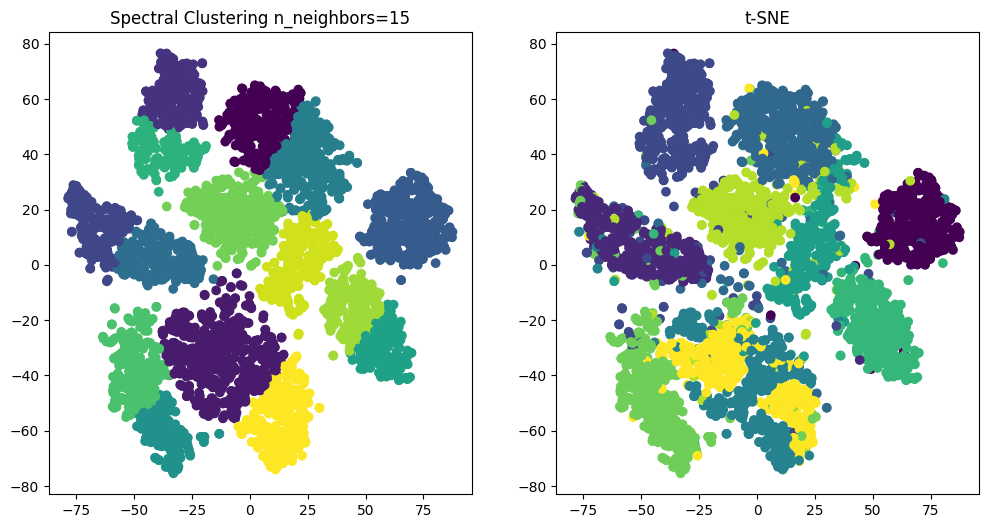

n_neighbors: 20 
 Silhouette score: 0.389 
 Homogeneity score: 0.789


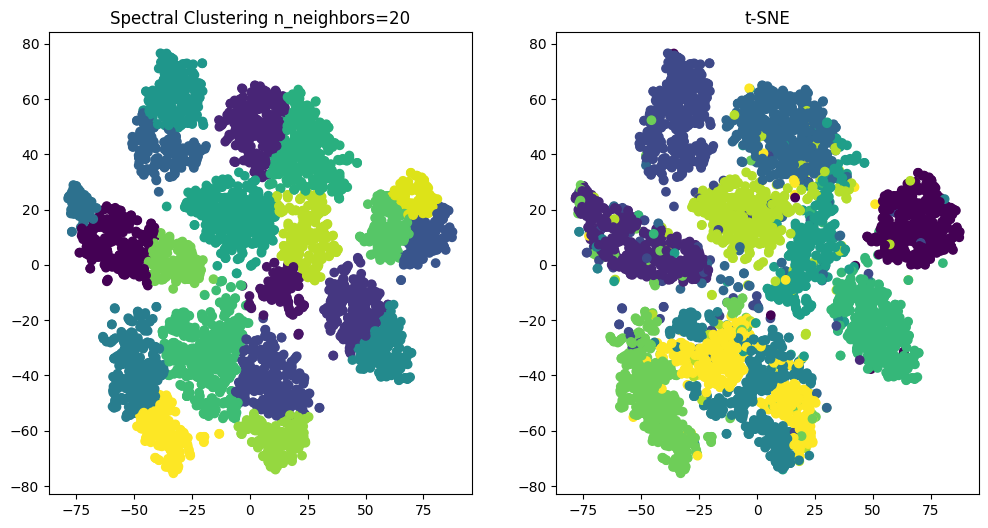

n_neighbors: 25 
 Silhouette score: 0.369 
 Homogeneity score: 0.793


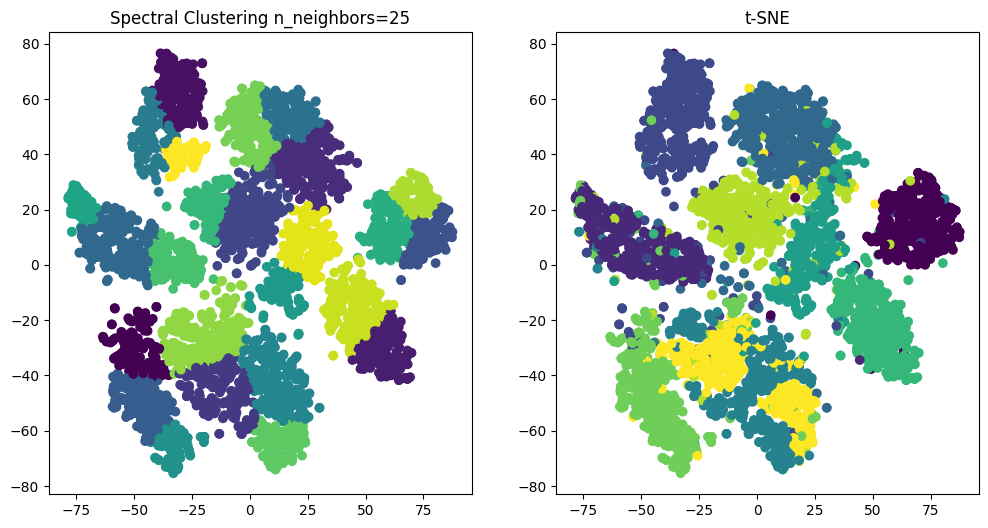

n_neighbors: 30 
 Silhouette score: 0.354 
 Homogeneity score: 0.799


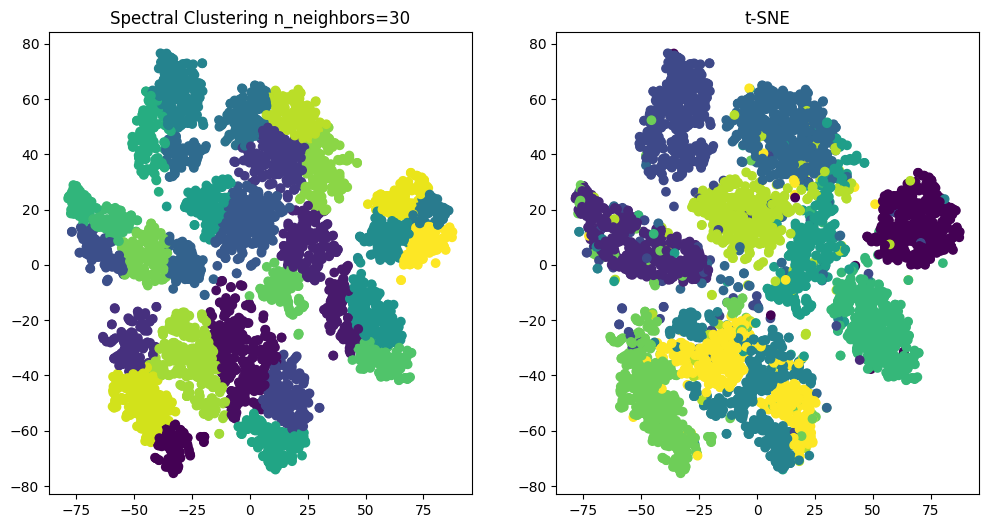

n_neighbors: 35 
 Silhouette score: 0.360 
 Homogeneity score: 0.820


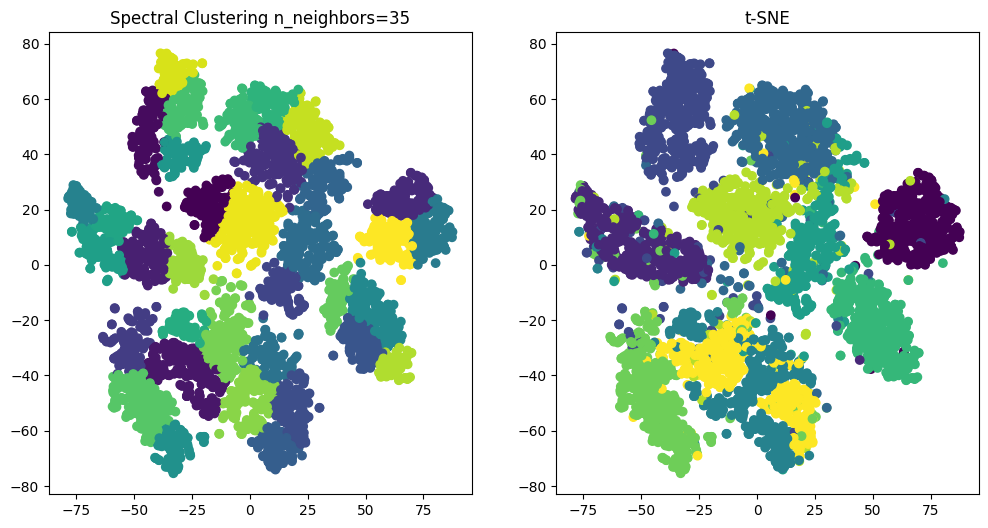

In [27]:
from sklearn.cluster import SpectralClustering

for i in range(5,40,5):
    sc = SpectralClustering(n_clusters=i,affinity='nearest_neighbors',assign_labels='kmeans',n_neighbors=i,n_jobs=-1)
    labels_nn = sc.fit_predict(x_tsne)
    silhouette = silhouette_score(x_tsne, labels_nn)
    homogeneity = homogeneity_score(y_downsampled, labels_nn)
    print("n_neighbors: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(i, silhouette, homogeneity))
    
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Create a scatter plot of the clustered data in the first subplot
    ax[0].scatter(x_tsne[:, 0],x_tsne[:, 1], c=labels_nn)
    ax[0].set_title("Spectral Clustering n_neighbors={}".format(i))

    # Create a scatter plot of the t-SNE reduced data in the second subplot
    ax[1].scatter(x_tsne[:, 0], x_tsne[:, 1],c=y_downsampled)
    ax[1].set_title("t-SNE")

    plt.show()

# Kmeans 

## Comparison of kmeans different cluster values with t-SNE

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 2 
 Silhouette score: 0.378 
 Homogeneity score: 0.244


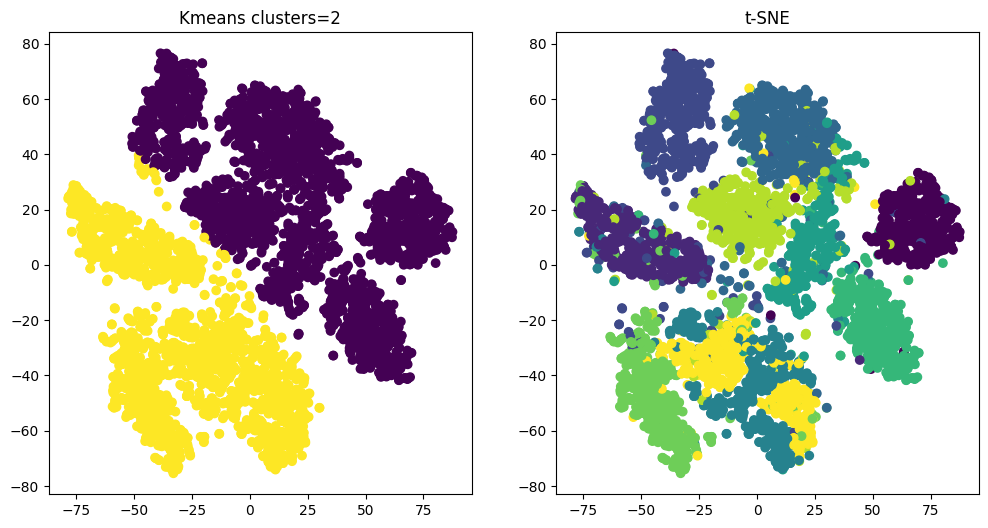

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 7 
 Silhouette score: 0.436 
 Homogeneity score: 0.616


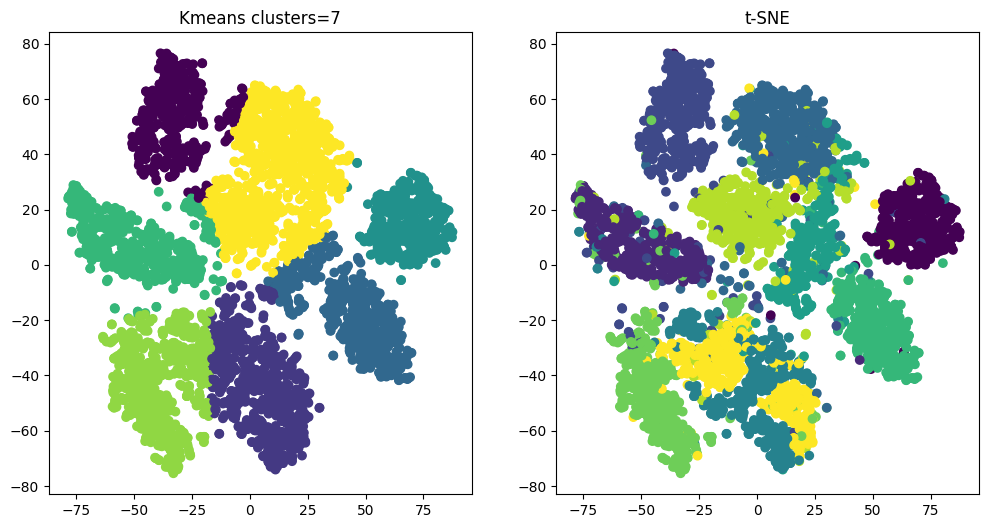

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 12 
 Silhouette score: 0.457 
 Homogeneity score: 0.766


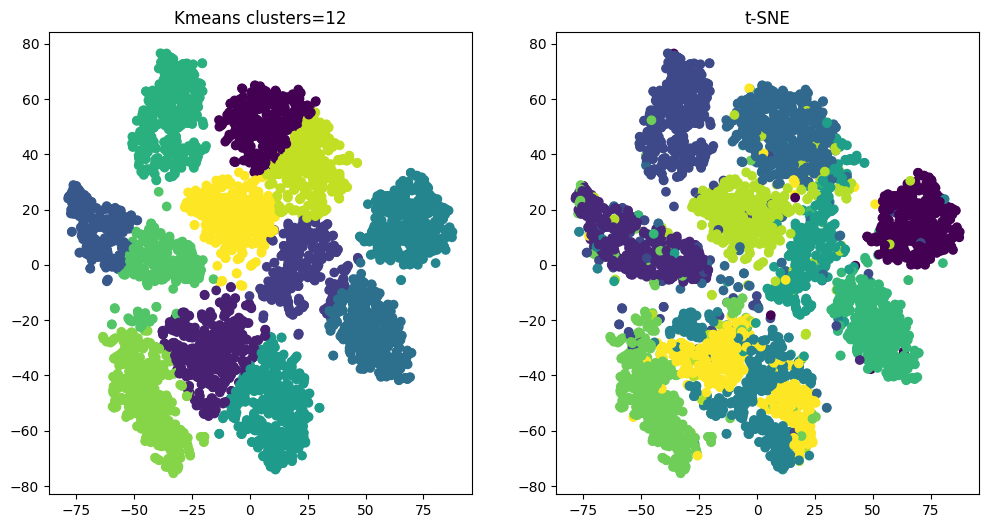

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 17 
 Silhouette score: 0.411 
 Homogeneity score: 0.775


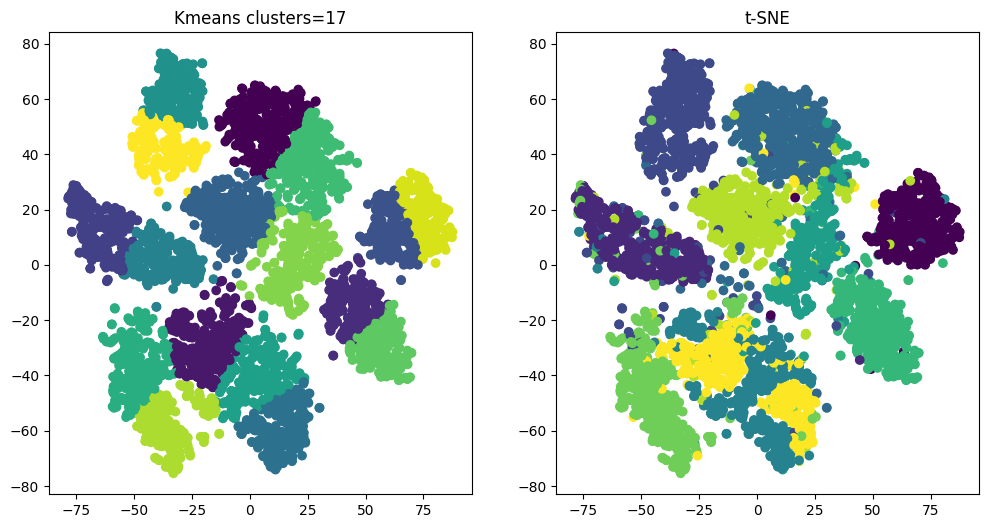

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 22 
 Silhouette score: 0.405 
 Homogeneity score: 0.796


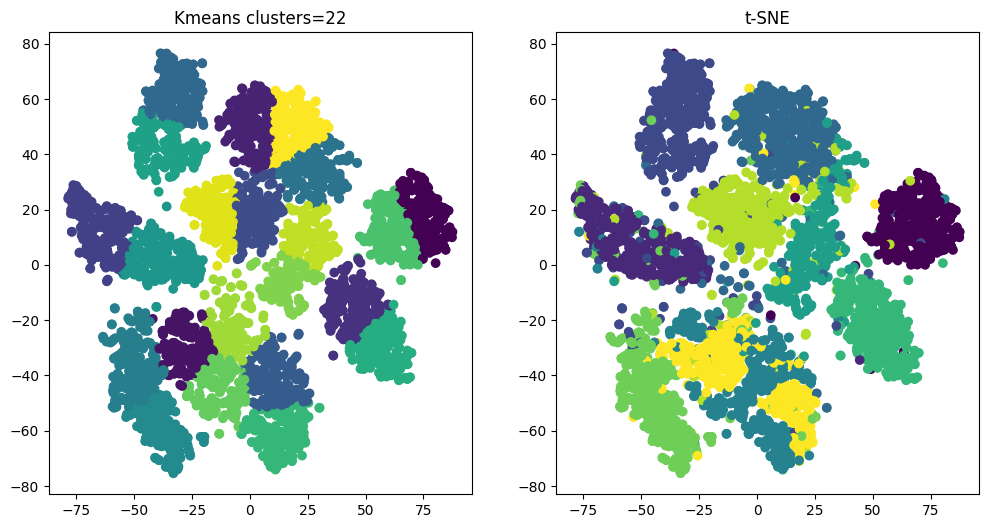

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 27 
 Silhouette score: 0.401 
 Homogeneity score: 0.797


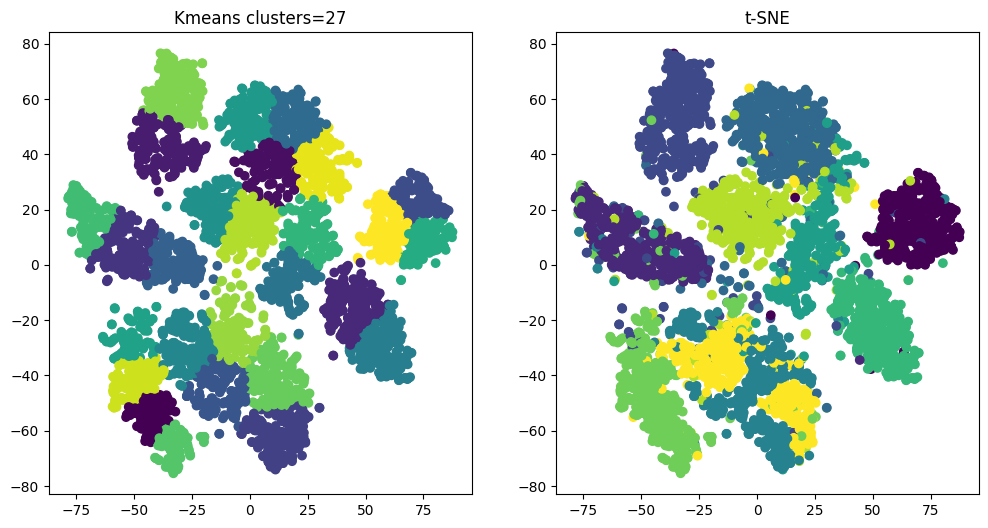

In [19]:
from sklearn.cluster import KMeans
for i in range(2,28,5):
    kmeans = KMeans(n_clusters=i)
    labels = kmeans.fit_predict(x_tsne)
    silhouette = silhouette_score(x_tsne, labels)
    homogeneity = homogeneity_score(y_downsampled, labels)
    print("kmeans: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(i, silhouette, homogeneity))
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Create a scatter plot of the clustered data in the first subplot
    ax[0].scatter(x_tsne[:, 0],x_tsne[:, 1], c=labels)
    ax[0].set_title("Kmeans clusters={}".format(i))

    # Create a scatter plot of the t-SNE reduced data in the second subplot
    ax[1].scatter(x_tsne[:, 0], x_tsne[:, 1],c=y_downsampled)
    ax[1].set_title("t-SNE")

    plt.show()

# Isomap

## Plots for different values of Isomap n_neigbors

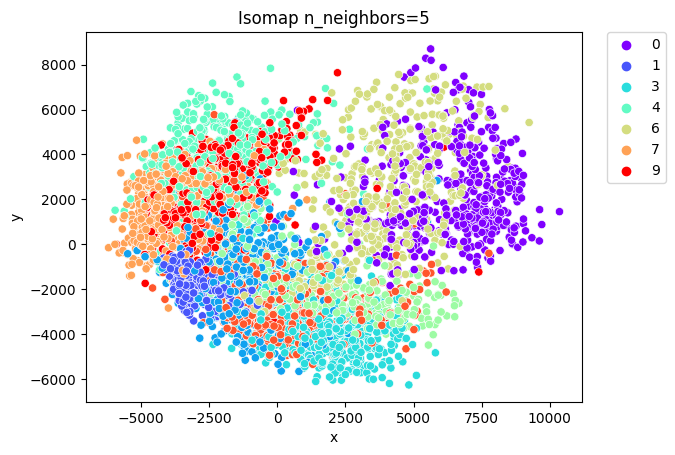

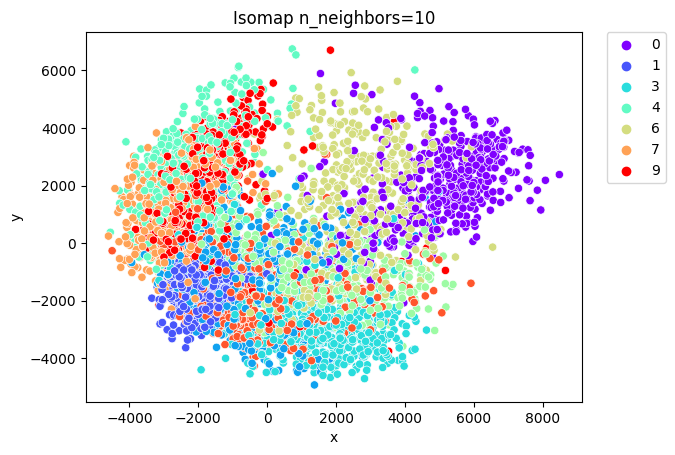

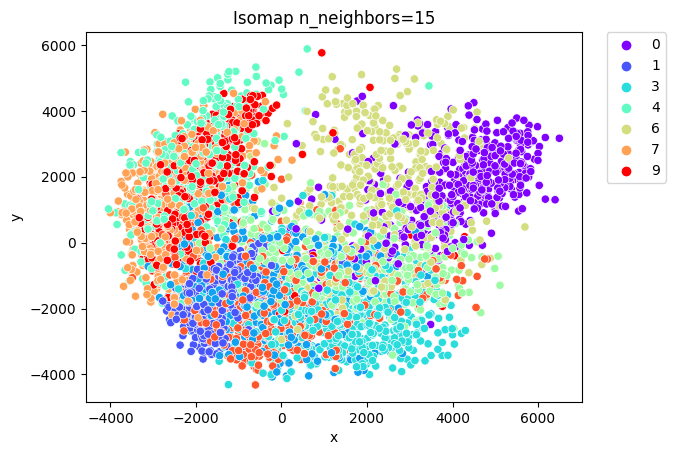

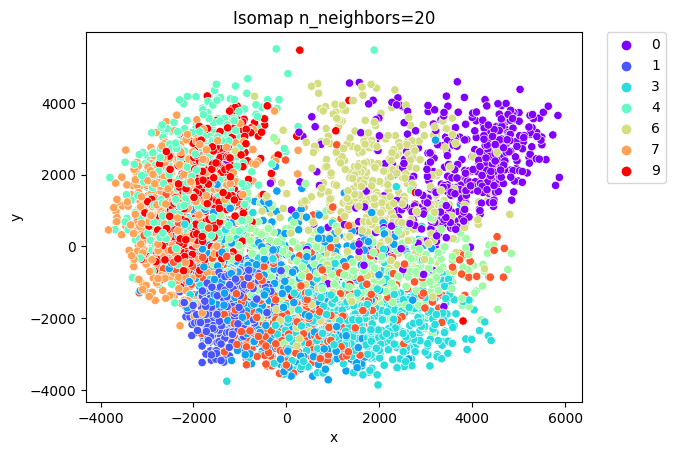

In [20]:
from sklearn.manifold import Isomap
for i in range(5,25,5):
    isomap = Isomap(n_components=2, n_neighbors=i,n_jobs=-1)
    X_isomap = isomap.fit_transform(X_downsampled)
    x_isomap_df = pd.DataFrame({'x': X_isomap[:,0], 'y': X_isomap[:,1], 'label': y_downsampled})
    fig, ax = plt.subplots(1)
    sns.scatterplot(x='x', y='y', hue='label',palette='rainbow', data=x_isomap_df, ax=ax)
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_title("Isomap n_neighbors={}".format(i))
    plt.show()

## Pairplot for Isomaps different n_neighbors

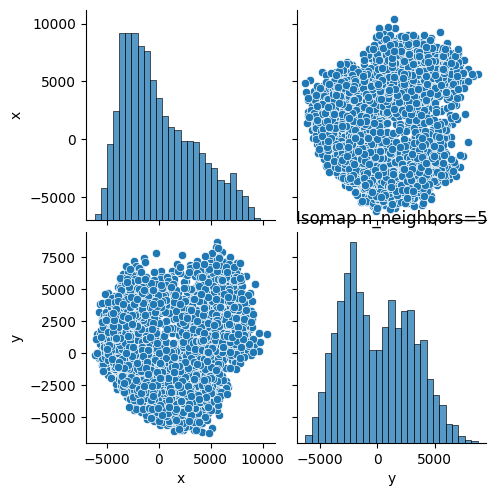

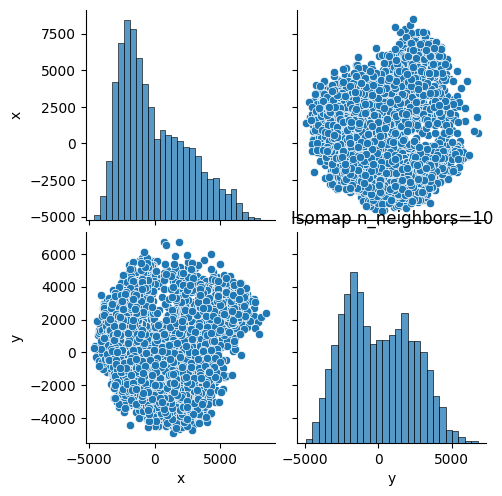

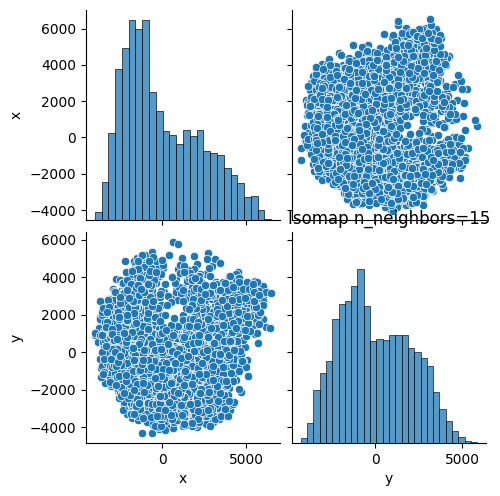

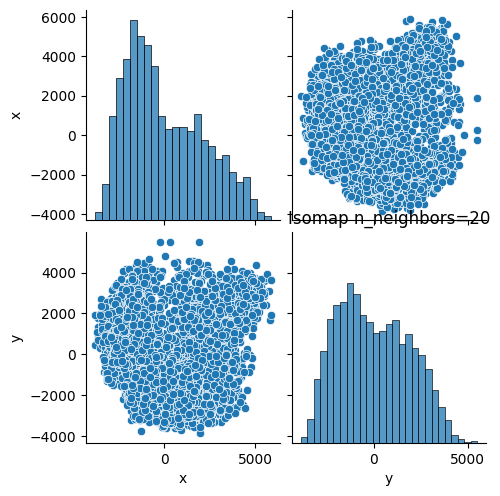

In [21]:
from sklearn.manifold import Isomap
for i in range(5,25,5):
    isomap = Isomap(n_components=2, n_neighbors=i,n_jobs=-1)
    X_isomap = isomap.fit_transform(X_downsampled)
    x_isomap_df = pd.DataFrame({'x': X_isomap[:,0], 'y': X_isomap[:,1], 'label': y_downsampled})
    sns.pairplot(x_isomap_df.drop(columns = 'label'))
    plt.title("Isomap n_neighbors={}".format(i))
    plt.show()

In [30]:
isomap = Isomap(n_components=2, n_neighbors=10,n_jobs=-1)
X_isomap = isomap.fit_transform(X_downsampled)

In [47]:
c = SpectralClustering(n_clusters=10,affinity='rbf',assign_labels='kmeans')
c = SpectralClustering(n_clusters=10,affinity='rbf',assign_labels='kmeans')
labels_rbf = sc.fit_predict(X_isomap)

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:189: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\pairwise.py:370: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:681: RuntimeWarning: overflow encountered in square
  lloyd_iter(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:430: ConvergenceWarning: Number of distin

In [48]:
labels_rbf.shape

(5000,)

In [49]:
c = SpectralClustering(n_clusters=10,affinity='rbf',assign_labels='kmeans')
labels_rbf = sc.fit_predict(X_isomap)
#silhouette = silhouette_score(X_isomap, labels_rbf)
homogeneity = homogeneity_score(y_downsampled, labels_rbf)

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:189: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\pairwise.py:370: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:681: RuntimeWarning: overflow encountered in square
  lloyd_iter(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:430: ConvergenceWarning: Number of distin

In [44]:
X_isomap.shape[]

(5000, 2)

In [43]:
y_downsampled.shape[0]

5000

# Spectral Clustering with RBF

## Comparison between Spectral Clustering n_clusters and t-SNE

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:189: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\pairwise.py:370: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:681: RuntimeWarning: overflow encountered in square
  lloyd_iter(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:430: ConvergenceWarning: Number of distin

rbf: 2 
 Silhouette score: 0.360 
 Homogeneity score: 0.000


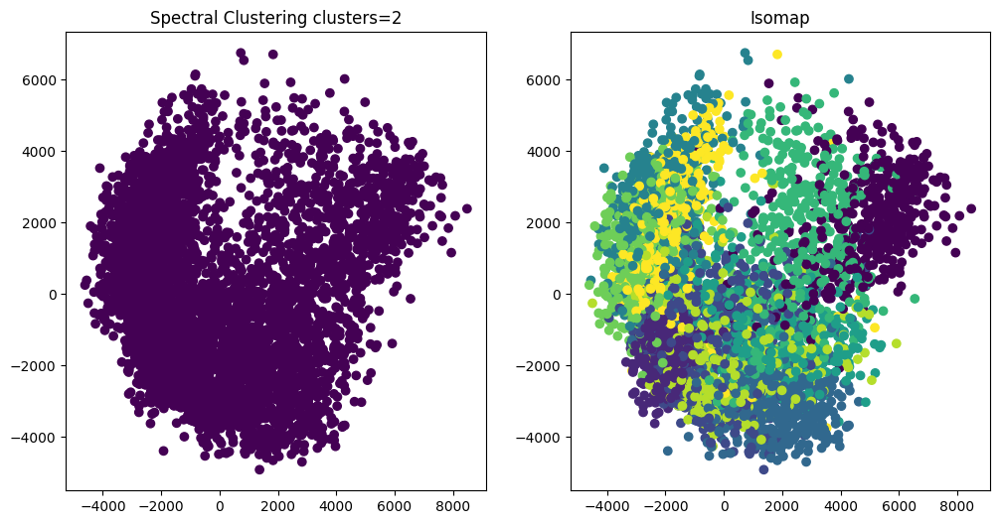

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\extmath.py:189: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\pairwise.py:370: RuntimeWarning: invalid value encountered in add
  distances += XX
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:681: RuntimeWarning: overflow encountered in square
  lloyd_iter(
C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:430: ConvergenceWarning: Number of distin

rbf: 3 
 Silhouette score: 0.360 
 Homogeneity score: 0.000


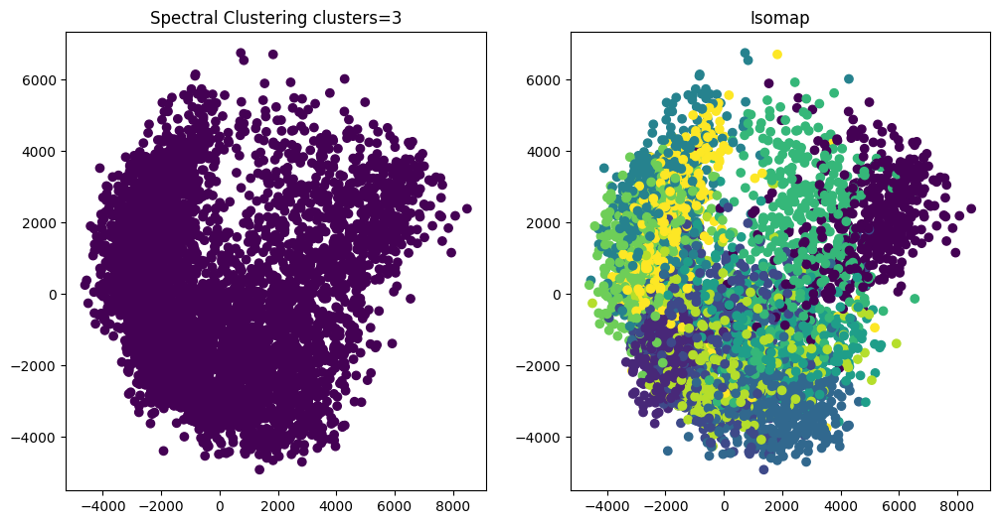

In [50]:
for i in range(2,4,1):
    sc = SpectralClustering(n_clusters=i,affinity='rbf',assign_labels='kmeans')
    labels_rbf = sc.fit_predict(X_isomap)
    #silhouette = silhouette_score(X_isomap, labels_rbf)
    homogeneity = homogeneity_score(y_downsampled, labels_rbf)
    print("rbf: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(i, silhouette, homogeneity))
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Create a scatter plot of the clustered data in the first subplot
    ax[0].scatter(X_isomap[:, 0],X_isomap[:, 1], c=labels_rbf)
    ax[0].set_title("Spectral Clustering clusters={}".format(i))

    # Create a scatter plot of the t-SNE reduced data in the second subplot
    ax[1].scatter(X_isomap[:, 0], X_isomap[:, 1],c=y_downsampled)
    ax[1].set_title("Isomap")

    plt.show()

# Spectral Clustering with nearest neighbors

## Comparison between Spectral Clustering n_neighbors and t-SNE

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_neighbors: 5 
 Silhouette score: 0.167 
 Homogeneity score: 0.383


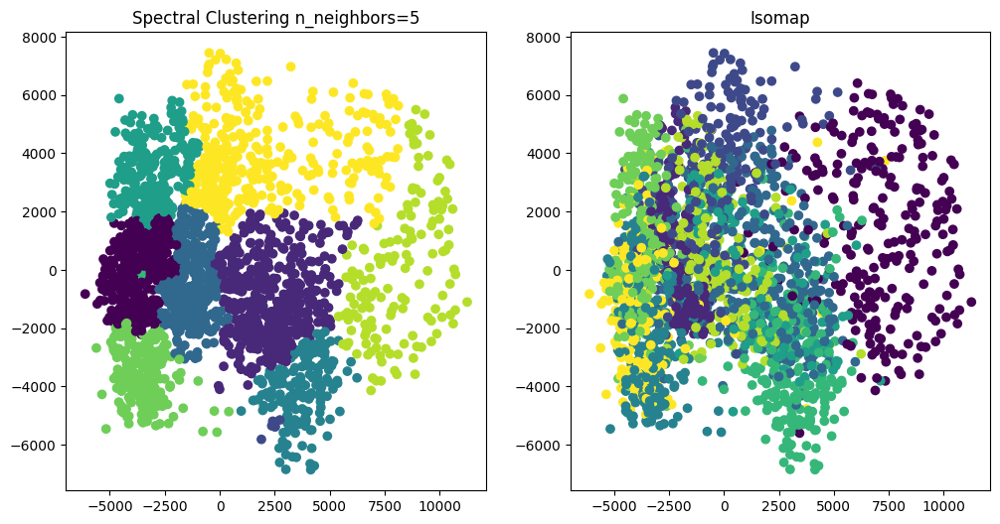

n_neighbors: 10 
 Silhouette score: 0.322 
 Homogeneity score: 0.421


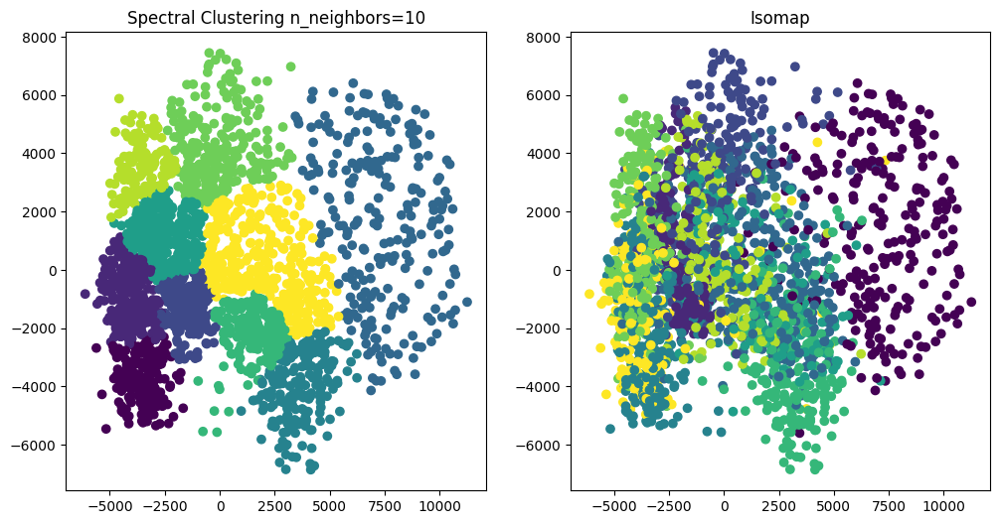

n_neighbors: 15 
 Silhouette score: 0.349 
 Homogeneity score: 0.407


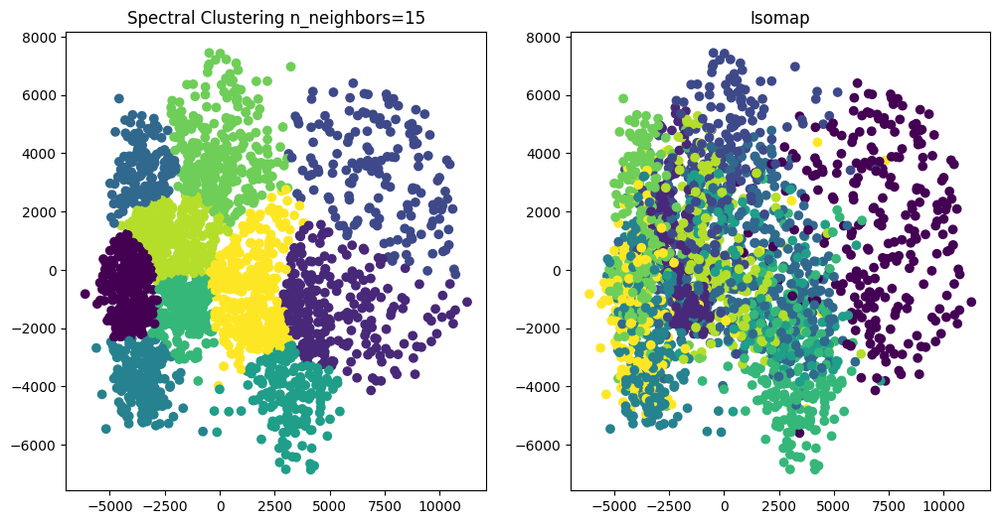

n_neighbors: 20 
 Silhouette score: 0.349 
 Homogeneity score: 0.404


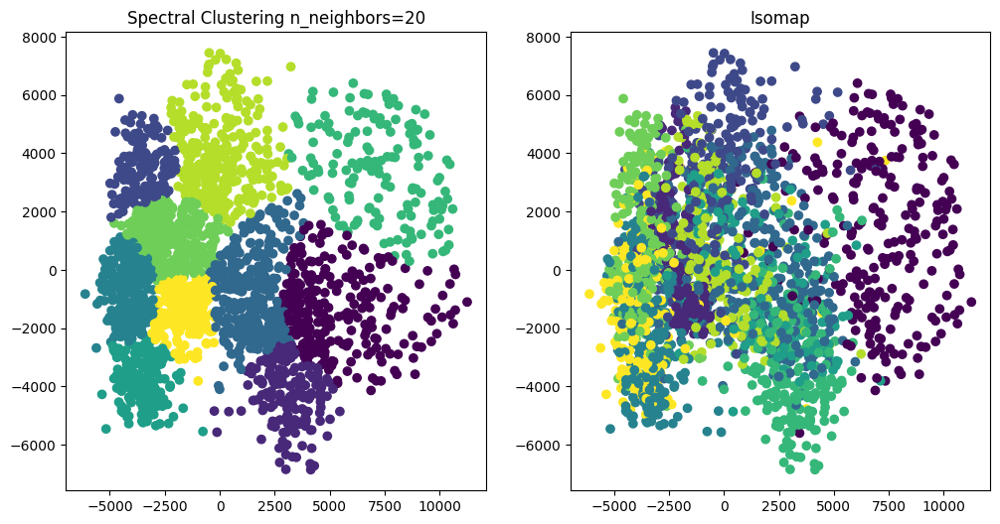

n_neighbors: 25 
 Silhouette score: 0.346 
 Homogeneity score: 0.404


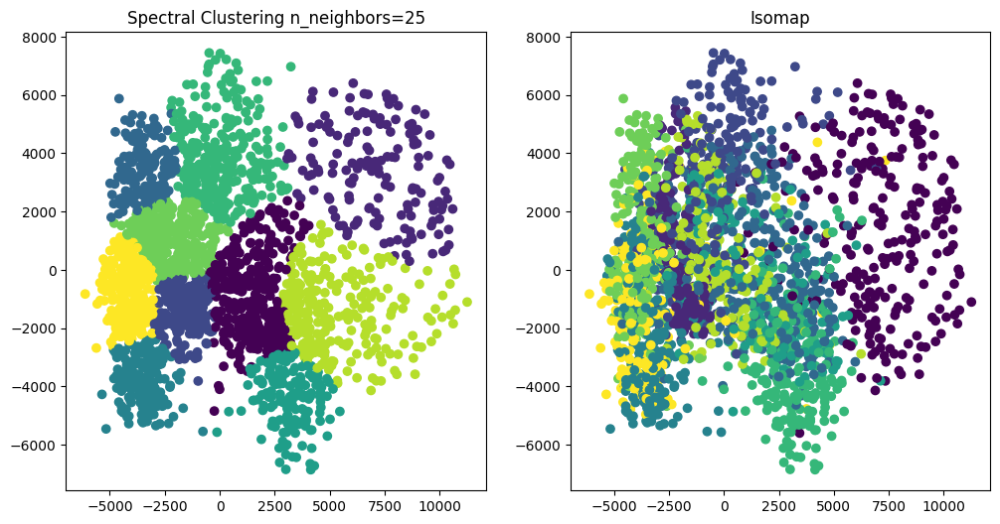

n_neighbors: 30 
 Silhouette score: 0.348 
 Homogeneity score: 0.405


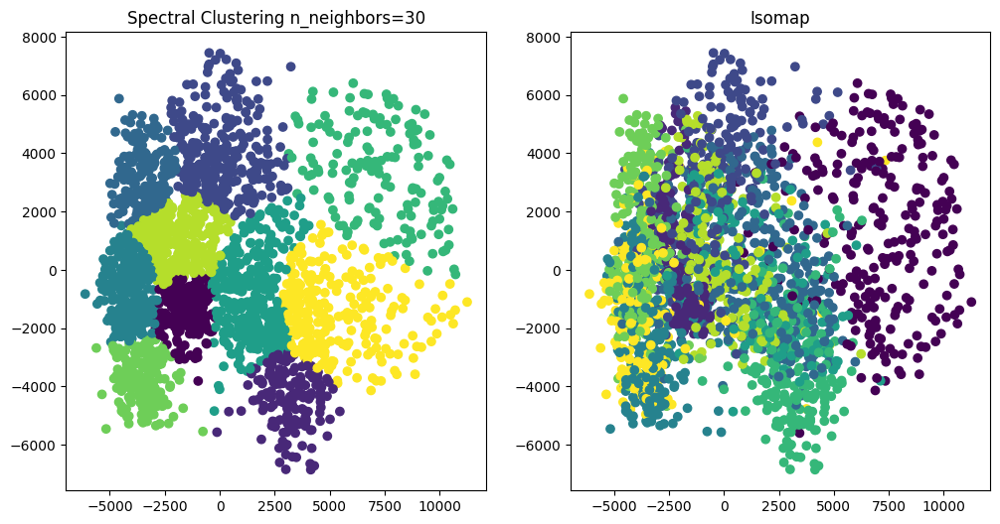

n_neighbors: 35 
 Silhouette score: 0.348 
 Homogeneity score: 0.405


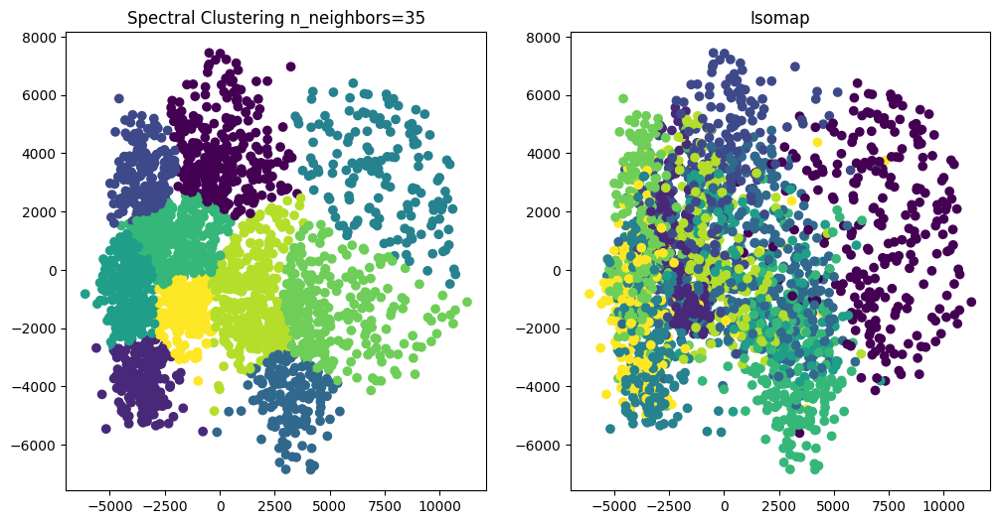

In [ ]:
for i in range(5,40,5):
    sc = SpectralClustering(n_clusters=10,affinity='nearest_neighbors',assign_labels='kmeans',n_neighbors=i,n_jobs=-1)
    labels_nn = sc.fit_predict(X_isomap)
    silhouette = silhouette_score(X_isomap, labels_nn)
    homogeneity = homogeneity_score(y_downsampled, labels_nn)
    print("n_neighbors: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(i, silhouette, homogeneity))
    
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Create a scatter plot of the clustered data in the first subplot
    ax[0].scatter(X_isomap[:, 0],X_isomap[:, 1], c=labels_nn)
    ax[0].set_title("Spectral Clustering n_neighbors={}".format(i))

    # Create a scatter plot of the t-SNE reduced data in the second subplot
    ax[1].scatter(X_isomap[:, 0], X_isomap[:, 1],c=y_downsampled)
    ax[1].set_title("Isomap")

    plt.show()

# Kmeans

## Comparison of kmeans different cluster values with t-SNE


C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 2 
 Silhouette score: 0.441 
 Homogeneity score: 0.173


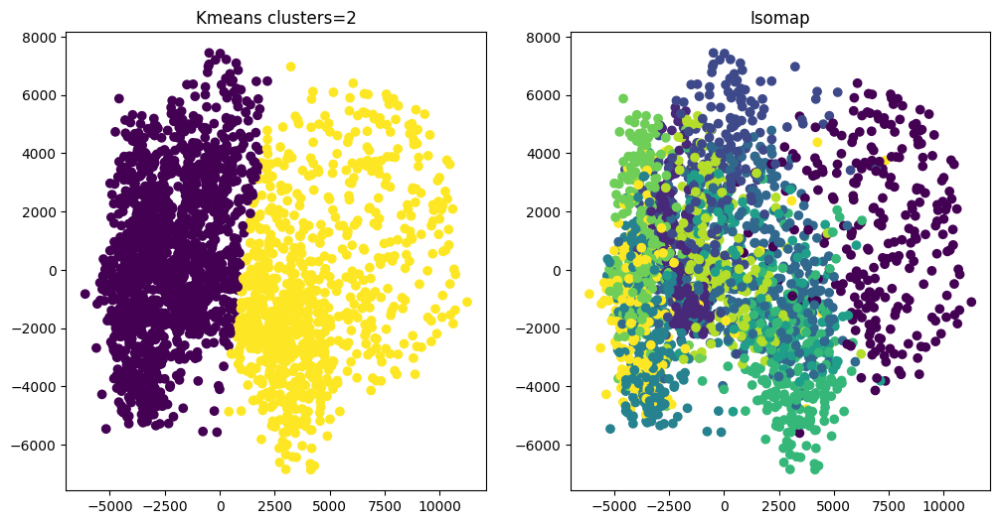

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 7 
 Silhouette score: 0.369 
 Homogeneity score: 0.374


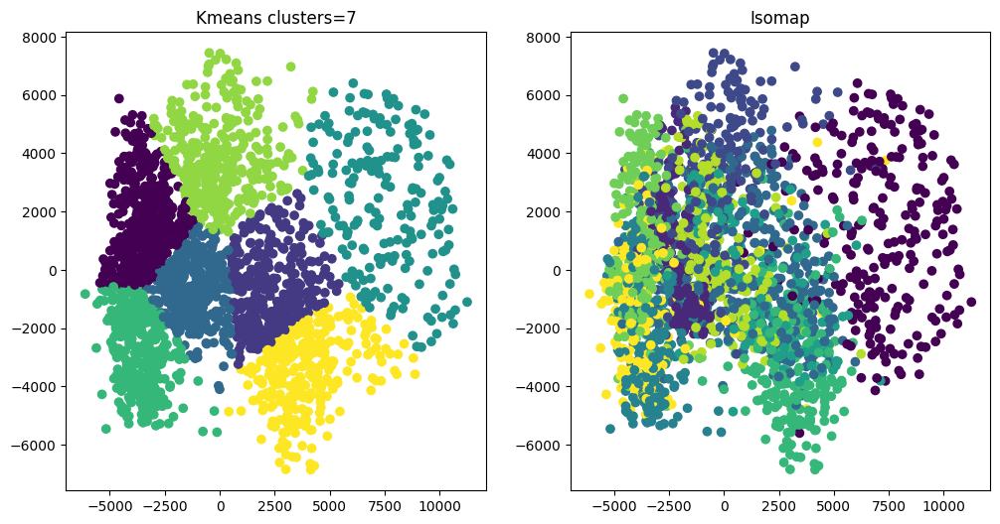

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 12 
 Silhouette score: 0.380 
 Homogeneity score: 0.432


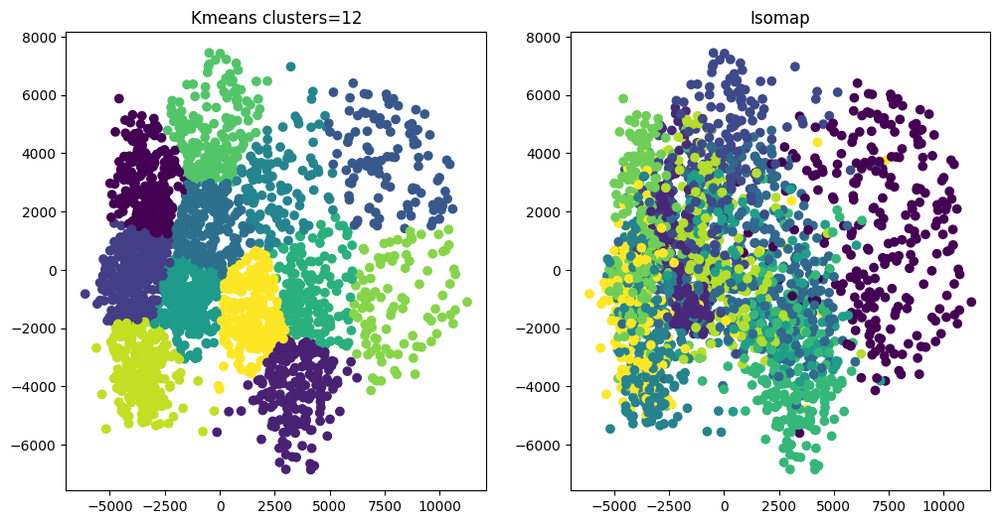

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 17 
 Silhouette score: 0.372 
 Homogeneity score: 0.451


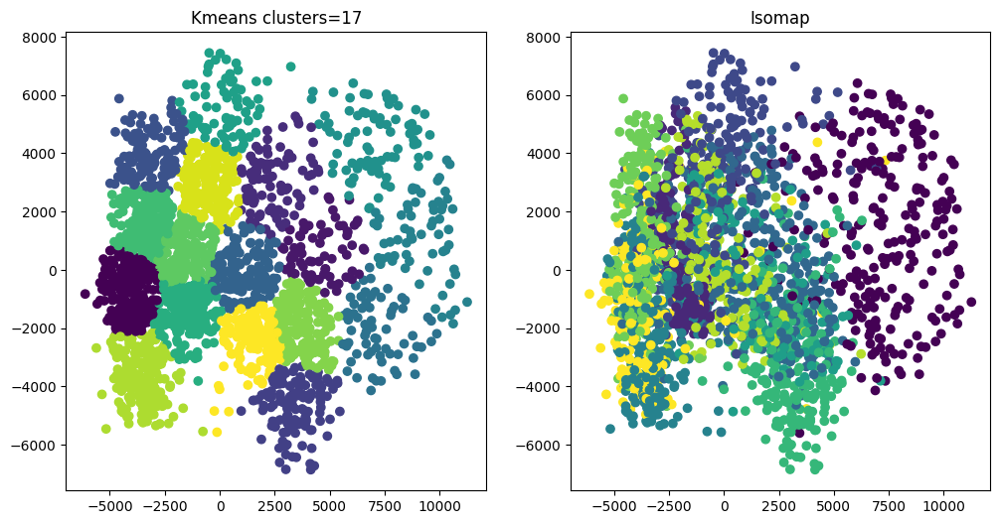

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 22 
 Silhouette score: 0.352 
 Homogeneity score: 0.472


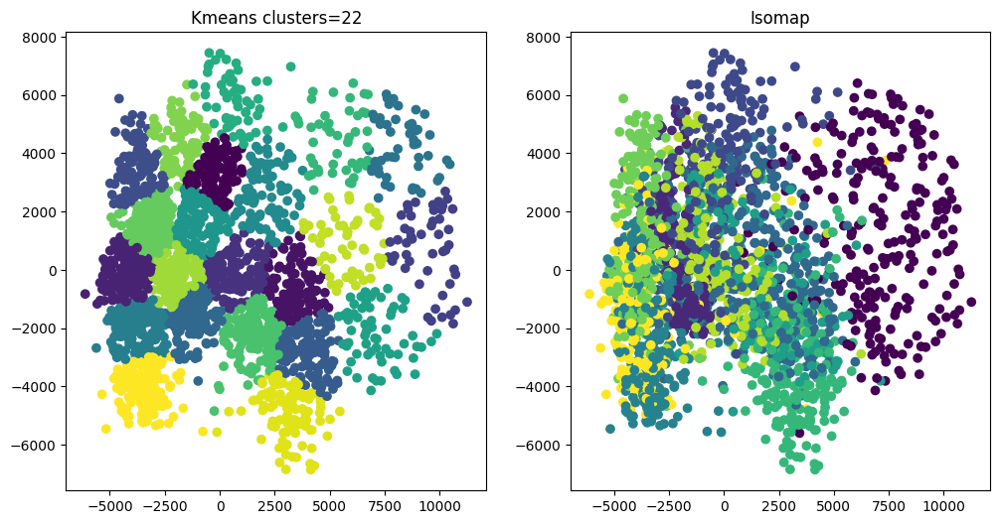

C:\Users\vaasimak\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


kmeans: 27 
 Silhouette score: 0.341 
 Homogeneity score: 0.479


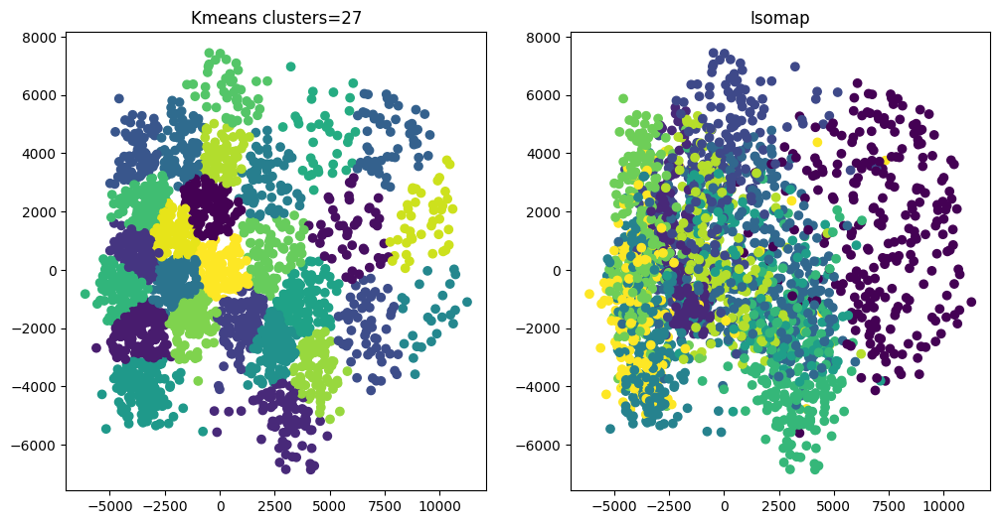

In [ ]:
from sklearn.cluster import KMeans
for i in range(2,28,5):
    kmeans = KMeans(n_clusters=i)
    labels = kmeans.fit_predict(X_isomap)
    silhouette = silhouette_score(X_isomap, labels)
    homogeneity = homogeneity_score(y_downsampled, labels)
    print("kmeans: {} \n Silhouette score: {:.3f} \n Homogeneity score: {:.3f}".format(i, silhouette, homogeneity))
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Create a scatter plot of the clustered data in the first subplot
    ax[0].scatter(X_isomap[:, 0],X_isomap[:, 1], c=labels)
    ax[0].set_title("Kmeans clusters={}".format(i))

    # Create a scatter plot of the t-SNE reduced data in the second subplot
    ax[1].scatter(X_isomap[:, 0], X_isomap[:, 1],c=y_downsampled)
    ax[1].set_title("Isomap")

    plt.show()